In [1]:
import pandas as pd
import numpy as np
import scipy

import matplotlib.pyplot as plt
import seaborn as sns

from google.cloud import bigquery as bq

%matplotlib inline

In [2]:
subtype_expression_bigtable = pd.read_table("./datasets/subtype_expression_bigtable.IlluminaHiSeq.tsv", sep="\t")

print(subtype_expression_bigtable.shape)
subtype_expression_bigtable.head()

/home/singuyen/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (9,10,11,12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(4082400, 16)


,case_barcode,sample_barcode,aliquot_barcode,gene_symbol,normalized_count,transformed_count,sample_type,sample_type_name,subtype,ER,PR,Her2_IHC,Her2_ISH,Her2,triple_negative,subtype_sub
0,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,A1CF,0.0000,0.000000,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA
1,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,AACS,1087.3986,10.087991,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA
2,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,AARS2,689.8967,9.432326,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA
3,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,AASS,45.8396,5.549657,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA
4,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,AATF,1518.9114,10.569772,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA


In [3]:
print("Sample types")
print(subtype_expression_bigtable.drop_duplicates(subset="sample_barcode").sample_type_name.value_counts())
print("\n")

print("BRCA subtypes")
print(subtype_expression_bigtable.drop_duplicates(subset="case_barcode").subtype_sub.value_counts())

Sample types
Primary solid Tumor    1095
Solid Tissue Normal     113
Metastatic                7
Name: sample_type_name, dtype: int64


BRCA subtypes
LumA        566
LumB        217
Basal       100
Basal-TN     90
Her2         82
Normal       40
Name: subtype_sub, dtype: int64


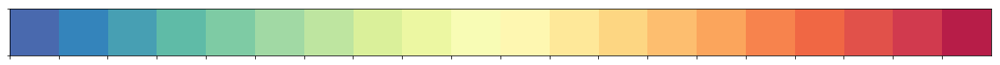

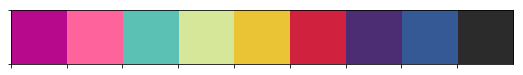

In [4]:
sns.palplot(sns.color_palette("Spectral_r", n_colors=20))
sns.palplot(sns.color_palette(["#b7098b","#ff639c", "#5bc1b5", 
                               "#d6e79a", "#eac435", "#d0213e", "#4c2c72", "#345995", 
                               "#2b2b2b"]))

# Correlation

In [5]:
expression_matrix = subtype_expression_bigtable.pivot(index='gene_symbol', 
                                                      columns='aliquot_barcode', values='transformed_count')

print(expression_matrix.shape)
expression_matrix.head()

(3360, 1215)


aliquot_barcode,TCGA-3C-AAAU-01A-11R-A41B-07,TCGA-3C-AALI-01A-11R-A41B-07,TCGA-3C-AALJ-01A-31R-A41B-07,TCGA-3C-AALK-01A-11R-A41B-07,TCGA-4H-AAAK-01A-12R-A41B-07,TCGA-5L-AAT0-01A-12R-A41B-07,TCGA-5L-AAT1-01A-12R-A41B-07,TCGA-5T-A9QA-01A-11R-A41B-07,TCGA-A1-A0SB-01A-11R-A144-07,TCGA-A1-A0SD-01A-11R-A115-07,...,TCGA-UL-AAZ6-01A-11R-A41B-07,TCGA-UU-A93S-01A-21R-A41B-07,TCGA-V7-A7HQ-01A-11R-A33J-07,TCGA-W8-A86G-01A-21R-A36F-07,TCGA-WT-AB41-01A-11R-A41B-07,TCGA-WT-AB44-01A-11R-A41B-07,TCGA-XX-A899-01A-11R-A36F-07,TCGA-XX-A89A-01A-11R-A36F-07,TCGA-Z7-A8R5-01A-42R-A41B-07,TCGA-Z7-A8R6-01A-11R-A41B-07
gene_symbol,,,,,,,,,,,,,,,,,,,,,
A1CF,0.000000,0.000000,0.931002,0.000000,0.511468,0.000000,0.000000,0.606916,0.000000,0.000000,...,0.484602,0.000000,0.000000,0.560324,0.000000,0.000000,0.000000,1.749234,0.000000,0.000000
AACS,10.087991,9.709642,10.583169,9.746663,9.715962,9.704860,9.870057,10.227883,11.093437,9.617864,...,10.874481,11.122136,10.743888,9.191722,9.828957,9.339208,10.177037,9.752542,10.054779,9.568417
AARS2,9.432326,8.887225,8.783685,8.758011,9.177038,9.189999,9.067306,9.599086,9.005875,8.864607,...,9.027868,8.517296,8.867862,9.262272,8.896490,9.204283,8.788828,9.363694,8.727503,9.048632
AASS,5.549657,6.185432,6.269705,7.525796,8.596031,8.893473,8.360313,7.188584,8.697004,8.371397,...,4.495567,5.496299,6.128743,9.158558,6.246429,9.008284,9.029711,7.319358,7.938422,5.358164
AATF,10.569772,12.901294,11.035428,10.904020,10.362294,10.174936,10.292855,10.900933,9.846231,10.373893,...,10.375926,9.941978,10.875037,9.961057,11.258412,9.940270,10.117439,9.508675,10.677939,10.300382


In [6]:
corr = expression_matrix.corr()

In [7]:
print(corr.min().min())
print(corr.max().max())

0.6966200283559904
1.0


# Include normal

In [8]:
color_matrix = pd.DataFrame()
df = subtype_expression_bigtable.drop_duplicates(subset="aliquot_barcode")

print(df['sample_type_name'].unique())
print(df['subtype'].unique())
print(df['triple_negative'].unique())

['Primary solid Tumor' 'Solid Tissue Normal' 'Metastatic']
['LumA' 'Her2' 'LumB' 'Normal' 'Basal']
['Unknown' 'Yes']


In [9]:
c = dict(zip(df['sample_type_name'].unique(), ["#ff639c", "#5bc1b5", "#b7098b"]))
color_matrix['Sample type'] = df['sample_type_name'].map(c)

c = dict(zip(df['subtype'].unique(), ["#d6e79a", "#4c2c72", "#eac435", "#345995", "#d0213e", "#ffffff"]))
color_matrix['Subtype'] = df['subtype'].map(c)

c = dict(zip(df['triple_negative'].unique(), ["#ffffff", "#2b2b2b"]))
color_matrix['Triple negative'] = df['triple_negative'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Sample type,Subtype,Triple negative
aliquot_barcode,,,
TCGA-3C-AAAU-01A-11R-A41B-07,#ff639c,#d6e79a,#ffffff
TCGA-3C-AALI-01A-11R-A41B-07,#ff639c,#4c2c72,#ffffff
TCGA-3C-AALJ-01A-31R-A41B-07,#ff639c,#eac435,#ffffff
TCGA-3C-AALK-01A-11R-A41B-07,#ff639c,#d6e79a,#ffffff
TCGA-4H-AAAK-01A-12R-A41B-07,#ff639c,#d6e79a,#ffffff


## data matrix - expression data

In [10]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')
expression_matrix = subtype_expression_bigtable.pivot(index='gene_symbol', 
                                                      columns='aliquot_barcode', values='transformed_count')

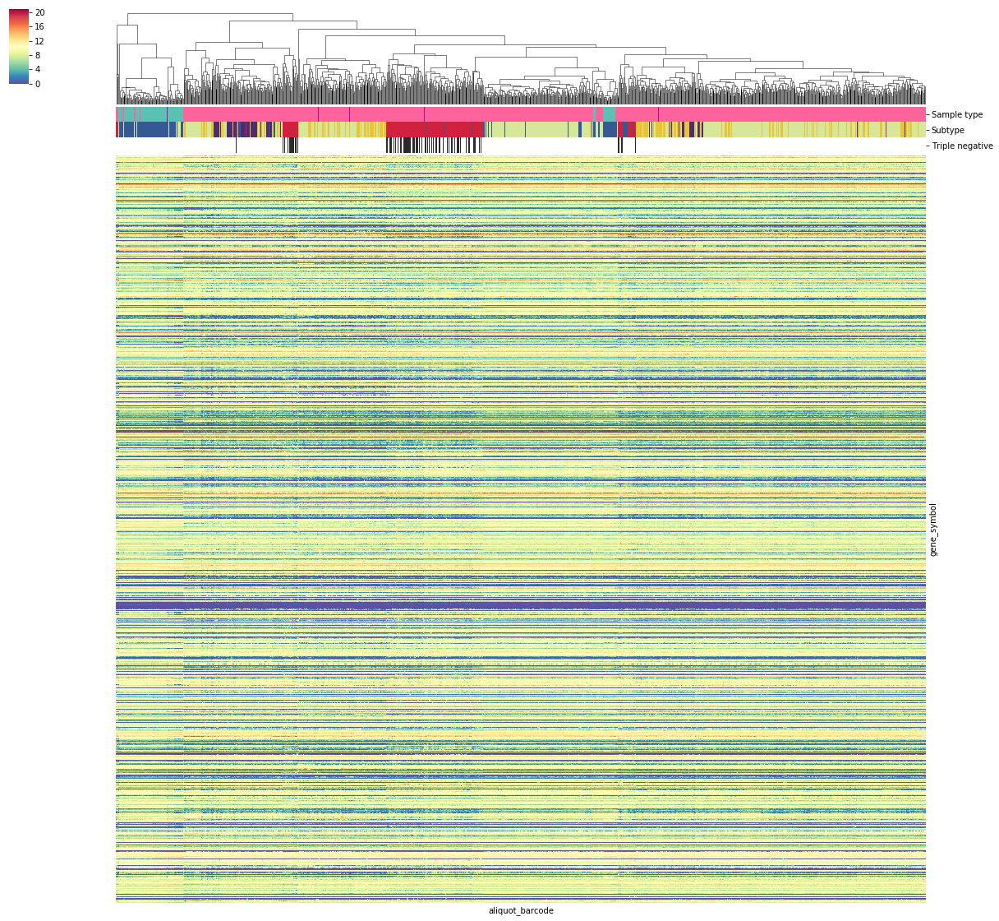

In [11]:
g = sns.clustermap(data=expression_matrix, 
                   col_linkage=linkage, row_cluster = False,
                   col_colors=color_matrix,
                   cmap="Spectral_r", vmin=0, vmax=21, figsize=(20,20), 
                   xticklabels=False, yticklabels=False)

In [12]:
g.savefig("./plots/cluster_expression.subtype.expressiondata.png")

## data matrix - correlation matrix

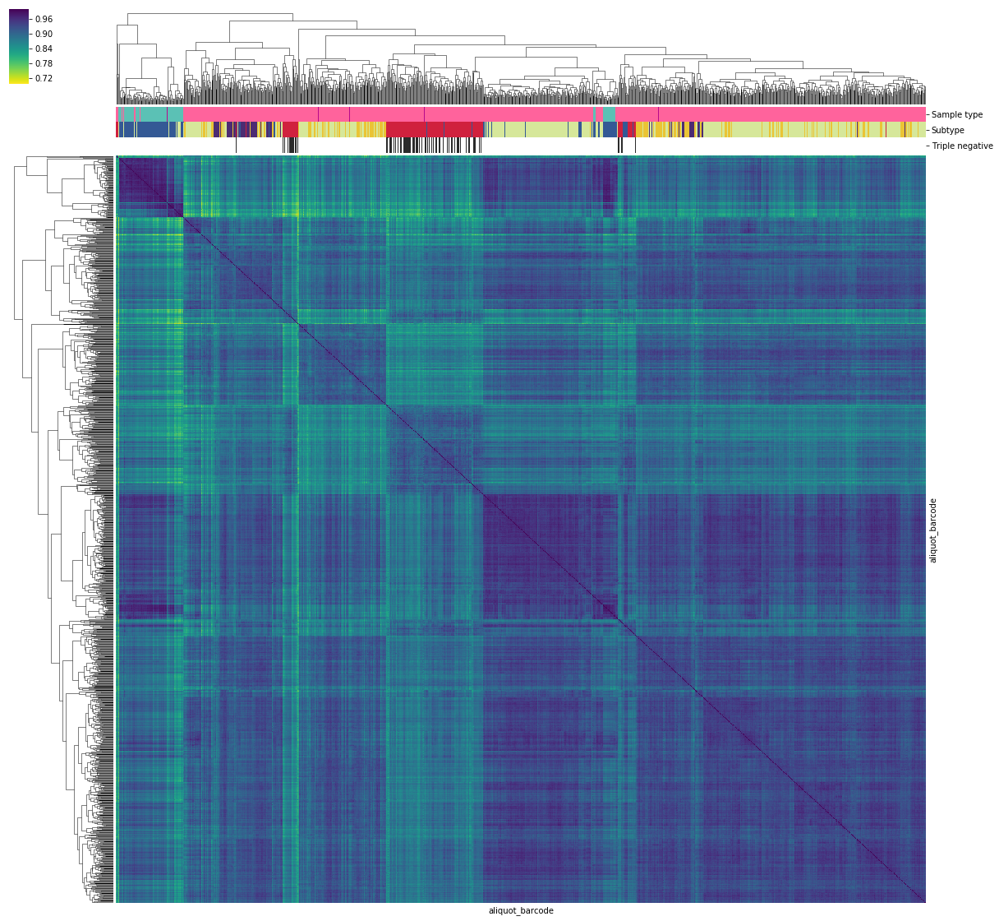

In [13]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')

g1 = sns.clustermap(data=corr, col_linkage=linkage, row_linkage=linkage,
                    col_colors=color_matrix,
                    cmap="viridis_r", vmax=1, figsize=(20,20), 
                    xticklabels=False, yticklabels=False)

In [14]:
g1.savefig("./plots/cluster_expression.subtype.corrdata.png")

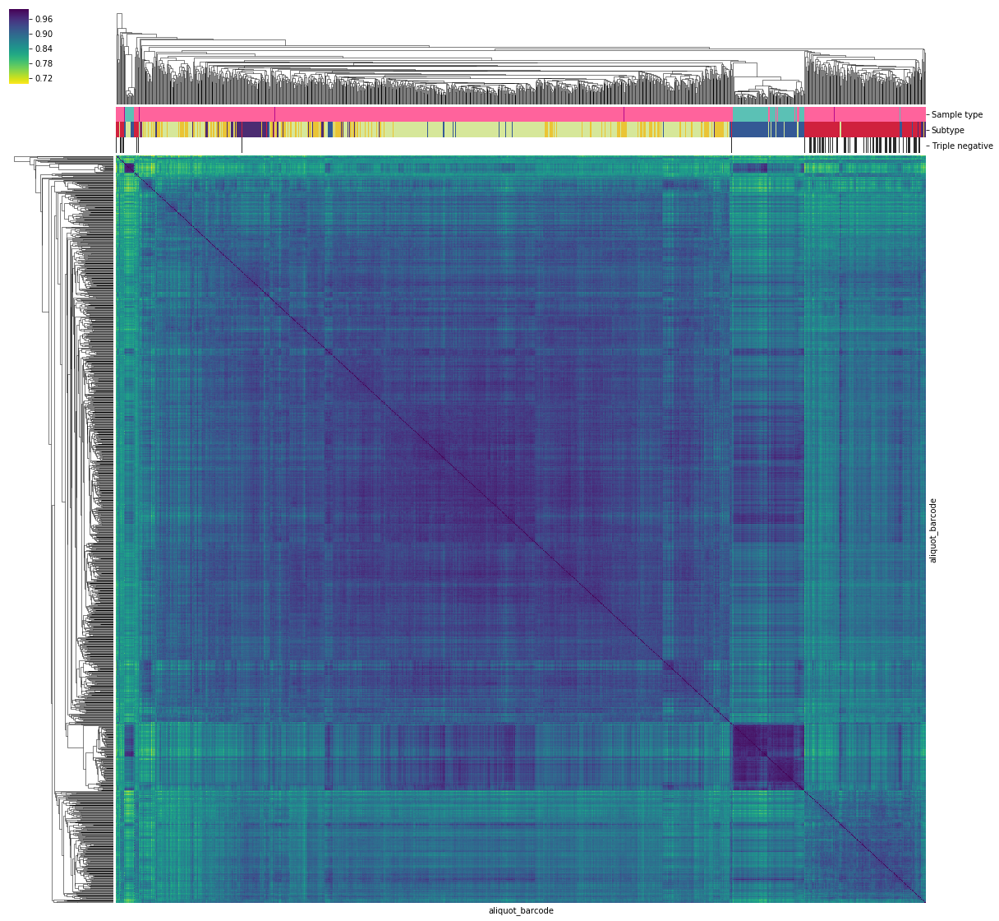

In [15]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

sns.clustermap(data=corr, col_linkage=linkage, row_linkage=linkage,
               col_colors=color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,20), 
               xticklabels=False, yticklabels=False)

# Exclude normal

In [16]:
exclude_normal = subtype_expression_bigtable.loc[subtype_expression_bigtable['sample_type'] != 11]
corr_excl_normal = corr.loc[list(exclude_normal['aliquot_barcode'].unique()), 
                            list(exclude_normal['aliquot_barcode'].unique())]

print(exclude_normal.shape)
print(exclude_normal.head())

print(corr_excl_normal.shape)

(3702720, 16)
   case_barcode    sample_barcode               aliquot_barcode gene_symbol  \
0  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07        A1CF   
1  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07        AACS   
2  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07       AARS2   
3  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07        AASS   
4  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07        AATF   

   normalized_count  transformed_count  sample_type     sample_type_name  \
0            0.0000           0.000000            1  Primary solid Tumor   
1         1087.3986          10.087991            1  Primary solid Tumor   
2          689.8967           9.432326            1  Primary solid Tumor   
3           45.8396           5.549657            1  Primary solid Tumor   
4         1518.9114          10.569772            1  Primary solid Tumor   

  subtype        ER        PR Her2_IHC Her2_ISH Her2 t

In [17]:
exclude_normal.drop_duplicates(subset="aliquot_barcode")['subtype'].unique()

array(['LumA', 'Her2', 'LumB', 'Normal', 'Basal'], dtype=object)

In [18]:
exclude_normal.drop_duplicates(subset="aliquot_barcode")['triple_negative'].unique()

array(['Unknown', 'Yes'], dtype=object)

In [19]:
color_matrix = pd.DataFrame()
df = exclude_normal.drop_duplicates(subset="aliquot_barcode")

c = dict(zip(df['subtype'].unique(), ["#d6e79a", "#4c2c72", "#eac435", "#345995", "#d0213e", "#ffffff"]))
color_matrix['Subtype'] = df['subtype'].map(c)

c = dict(zip(df['triple_negative'].unique(), ["#ffffff", "#2b2b2b"]))
color_matrix['Triple negative'] = df['triple_negative'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Subtype,Triple negative
aliquot_barcode,,
TCGA-3C-AAAU-01A-11R-A41B-07,#d6e79a,#ffffff
TCGA-3C-AALI-01A-11R-A41B-07,#4c2c72,#ffffff
TCGA-3C-AALJ-01A-31R-A41B-07,#eac435,#ffffff
TCGA-3C-AALK-01A-11R-A41B-07,#d6e79a,#ffffff
TCGA-4H-AAAK-01A-12R-A41B-07,#d6e79a,#ffffff


## data matrix - expression data

In [20]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')
expression_matrix = subtype_expression_bigtable.pivot(
                                    index='gene_symbol', columns='aliquot_barcode', values='transformed_count'
                                    ).loc[:,list(exclude_normal['aliquot_barcode'].unique())]

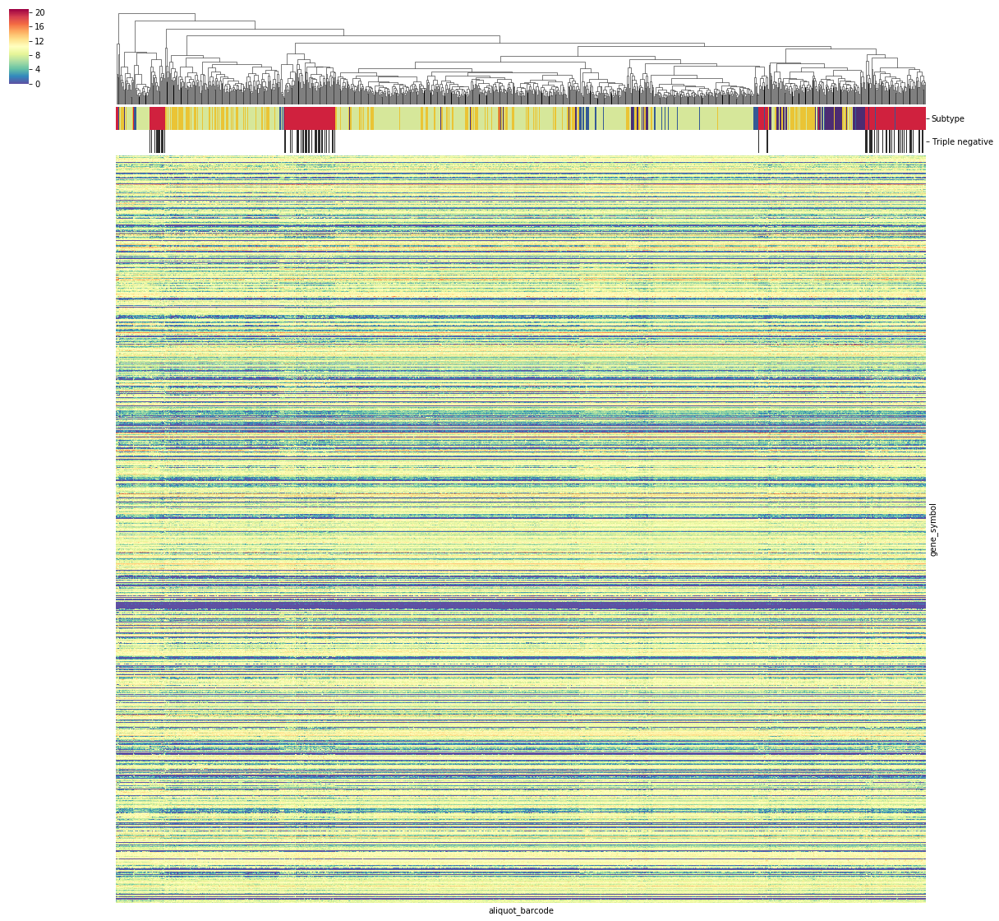

In [21]:
g2 = sns.clustermap(data=expression_matrix, 
                   col_linkage=linkage, row_cluster = False,
                   col_colors=color_matrix,
                   cmap="Spectral_r", vmin=0, vmax=21, figsize=(20,20), 
                   xticklabels=False, yticklabels=False)

In [22]:
g2.savefig("./plots/cluster_expression.subtype.exclNormal.expressiondata.png")

## data matrix - correlation data

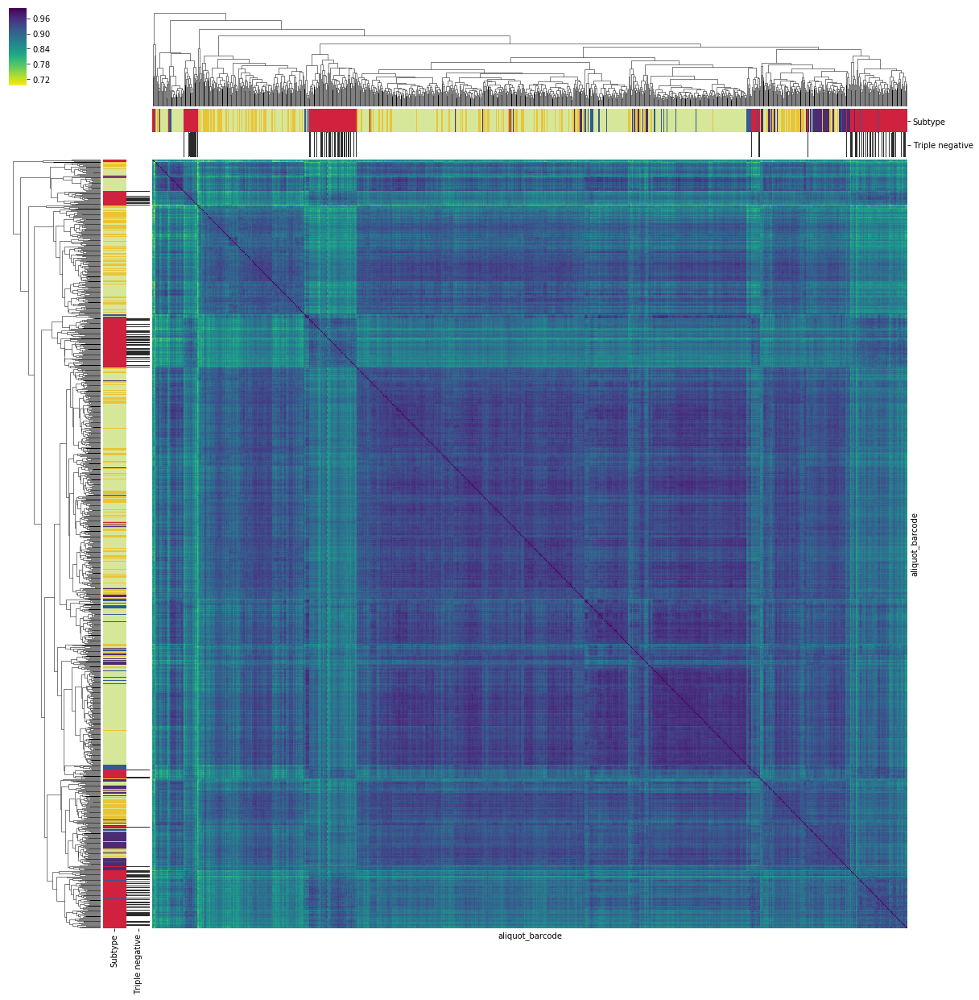

In [23]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')

g3 = sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
                    row_colors=color_matrix, col_colors = color_matrix,
                    cmap="viridis_r", vmax=1, figsize=(20,21), 
                    xticklabels=False, yticklabels=False)

In [24]:
g3.savefig("./plots/cluster_expression.subtype.exclNormal.corrdata.png")

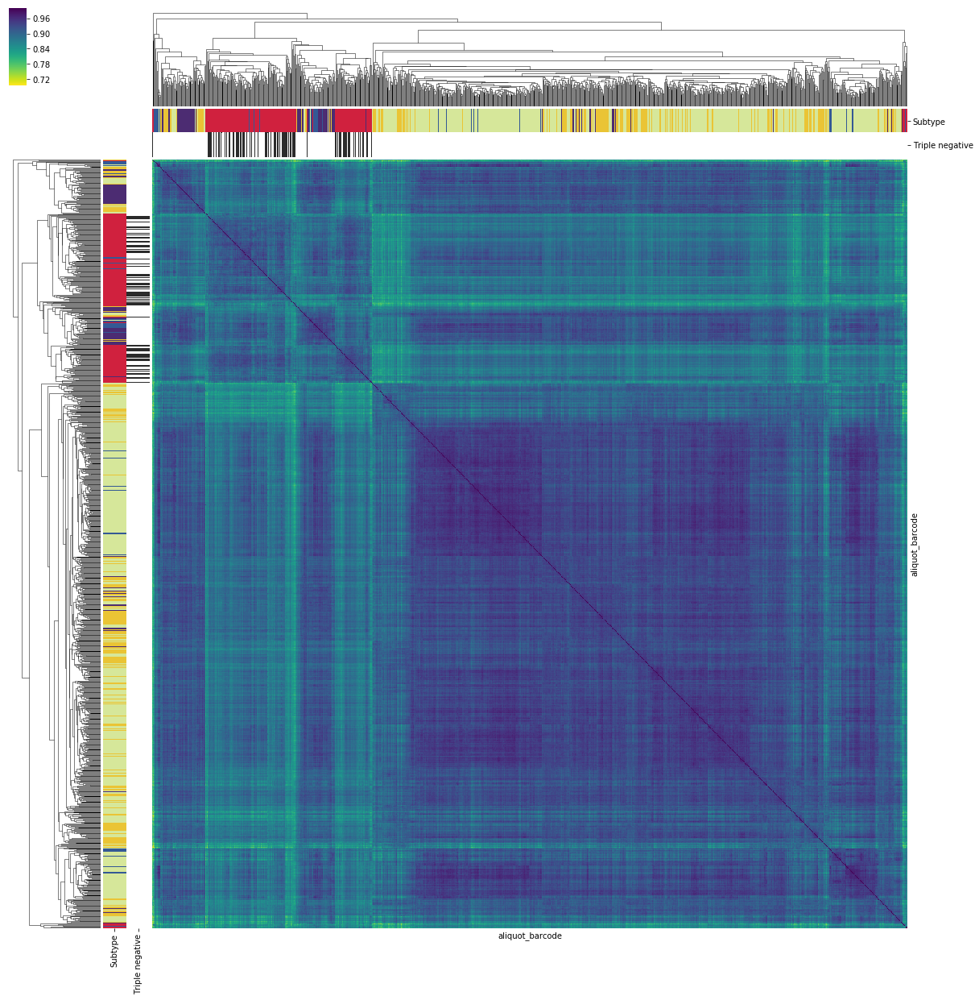

In [25]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='weighted')

sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,21), 
               xticklabels=False, yticklabels=False)

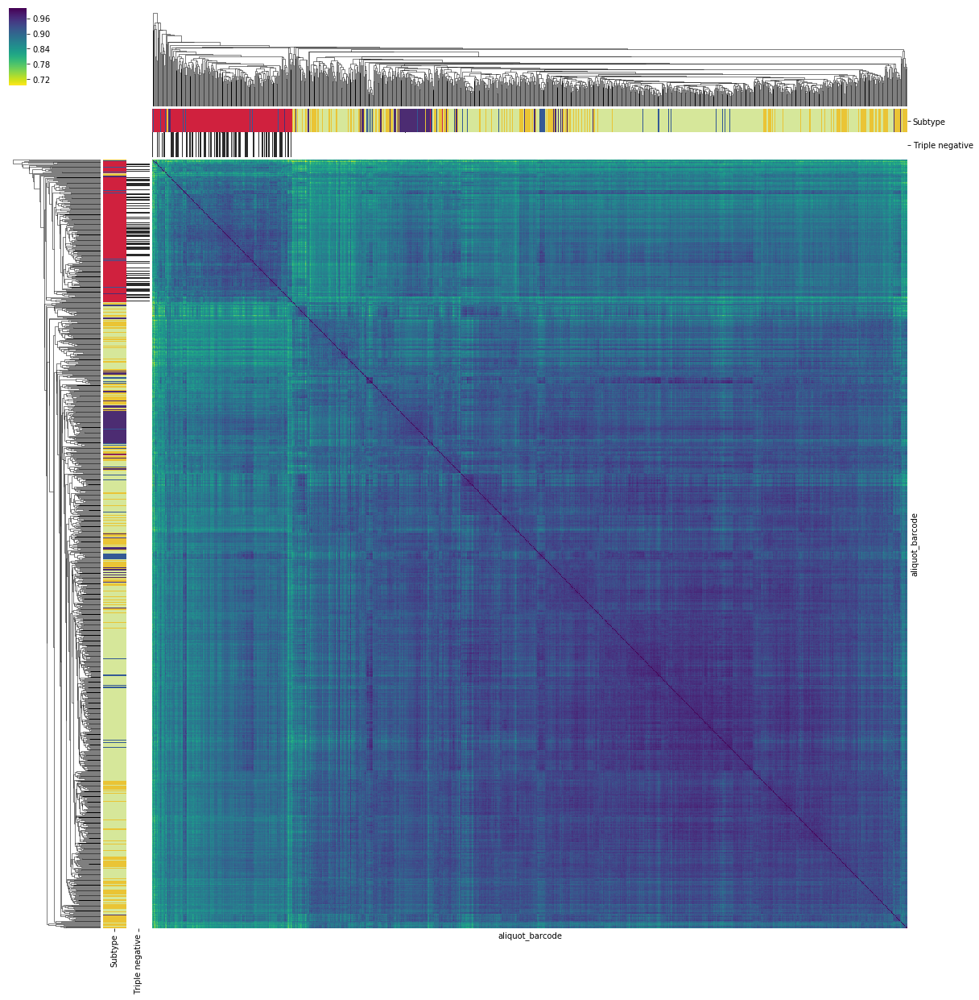

In [26]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,21), 
               xticklabels=False, yticklabels=False)

# Normal tissues only

In [27]:
normal_only = subtype_expression_bigtable.loc[subtype_expression_bigtable['sample_type'] == 11]
corr_normal = corr.loc[list(normal_only['aliquot_barcode'].unique()), 
                       list(normal_only['aliquot_barcode'].unique())]

print(normal_only.shape)
print(normal_only.head())

print(corr_normal.shape)

(379680, 16)
        case_barcode    sample_barcode               aliquot_barcode  \
423360  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   
423361  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   
423362  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   
423363  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   
423364  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   

       gene_symbol  normalized_count  transformed_count  sample_type  \
423360        A1CF            0.6349           0.709202           11   
423361        AACS         1132.0635          10.146013           11   
423362       AARS2          485.0413           8.924935           11   
423363        AASS          592.6984           9.213586           11   
423364        AATF         1138.7302          10.154477           11   

           sample_type_name subtype        ER        PR Her2_IHC  Her2_ISH  \
423360  Solid Tissue Normal  Normal  Negati

In [28]:
corr_normal.min().min()

0.7841361111717824

In [29]:
print(normal_only.drop_duplicates(subset="aliquot_barcode")['subtype'].unique())
normal_only.drop_duplicates(subset="aliquot_barcode")['subtype'].value_counts()

['Normal' 'LumA']


Normal    101
LumA       12
Name: subtype, dtype: int64

In [30]:
color_matrix = pd.DataFrame()
df = normal_only.drop_duplicates(subset="aliquot_barcode")

c = dict(zip(df['subtype'].unique(), ["#345995", "#d6e79a"]))
color_matrix['Subtype'] = df['subtype'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Subtype
aliquot_barcode,
TCGA-A7-A0CE-11A-21R-A089-07,#345995
TCGA-A7-A0CH-11A-32R-A089-07,#345995
TCGA-A7-A0D9-11A-53R-A089-07,#345995
TCGA-A7-A0DB-11A-33R-A089-07,#345995
TCGA-A7-A0DC-11A-41R-A089-07,#345995


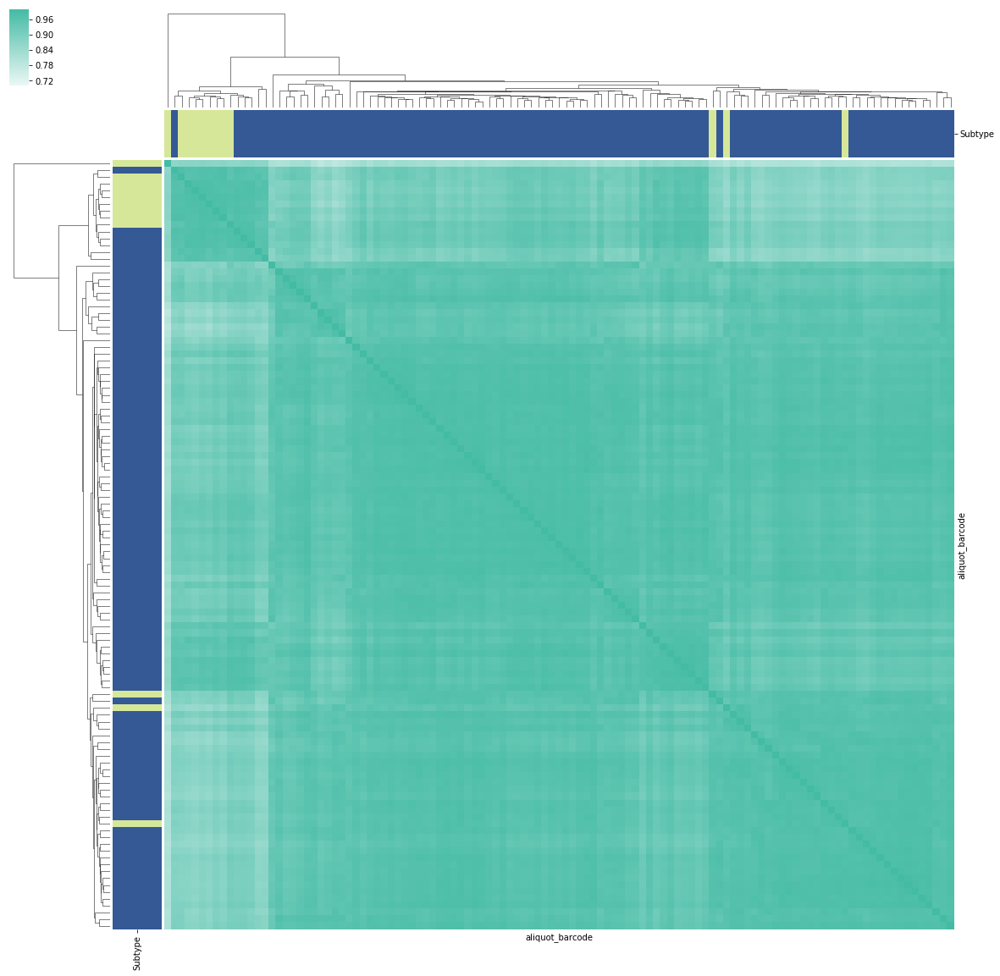

In [31]:
distance = scipy.spatial.distance.squareform(1-corr_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

sns.clustermap(data=corr_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap=sns.light_palette("#44bba4", input="hex", as_cmap=True), vmin=0.7, vmax=1, figsize=(20,20), 
               xticklabels=False, yticklabels=False)